# Multi-agent densities

This notebook illustrates a 1,000-step simulation with 64 agents, where we also calculate a level set (contour) probability estimate of positions within the model over time, for the current timeframe and for the entire model at large. Context-sensitive models use this to navigate the space of other agents.

In [1]:
from math import floor
from matplotlib import pyplot as plt
from celluloid import Camera
from IPython.display import HTML
import seaborn as sns
import numpy as np
from sadie.models.simple import SimpleModel
from sadie.agents.walkers import BaseWalker

In [2]:
m = SimpleModel(max_time=1000)
for i in range(64):
    m.add_agent(BaseWalker(0, 0))
m.run()

df = m.to_df()

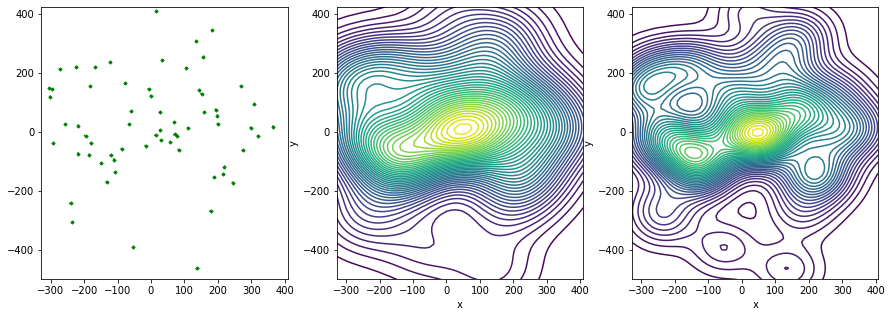

In [3]:
FRAMERATE: int = 1

fig, axs = plt.subplots(1, 3, figsize = (15, 5))
cam = Camera(fig)

for i in range(df.time.min(), df.time.max()):

    if i % FRAMERATE == 0 and i > 1:
        
        for j in range(3):
            axs[j].set_ylim(df.y.min(), df.y.max())
            axs[j].set_xlim(df.x.min(), df.x.max())

        subdf = df[(df.time <= i) & (df.time >= i - FRAMERATE * 5)]
        
        positions = subdf.groupby("id").last()
        
        axs[0].scatter(positions.x, positions.y, c="green", marker="D", s=5)
        
        for i in subdf.id.unique():
            axs[0].plot(subdf[subdf.id == i].x, subdf[subdf.id == i].y, "g:")
            
        
        sns.kdeplot(positions.x, positions.y, ax=axs[1], cmap="viridis", levels=50)

        sns.kdeplot(subdf.x, subdf.y, ax=axs[2], cmap="viridis", levels=50)
        

        cam.snap()


HTML(cam.animate().to_html5_video())